In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler

In [2]:
# Reading the datasets
df_train = pd.read_csv("data/stores_train.csv")
df_test = pd.read_csv("data/stores_test.csv")
df_bus_stops = pd.read_csv("data/busstops_norway_fixed.csv")
df_grunnkrets_age_dist = pd.read_csv("data/grunnkrets_age_distribution.csv")
df_grunnkrets_house_pers = pd.read_csv("data/grunnkrets_households_num_persons.csv")
df_grunnkrets_income_house = pd.read_csv("data/grunnkrets_income_households.csv")
df_grunnkrets_stripped = pd.read_csv("data/grunnkrets_norway_stripped.csv")
df_plaace_hierarchy = pd.read_csv("data/plaace_hierarchy.csv")
df_extra = pd.read_csv("data/stores_extra.csv")

In [3]:
# Only select 2016 year
df_grunnkrets_stripped = df_grunnkrets_stripped[df_grunnkrets_stripped.year == 2016]
df_grunnkrets_age_dist = df_grunnkrets_age_dist[df_grunnkrets_age_dist.year == 2016]
df_grunnkrets_house_pers = df_grunnkrets_house_pers[df_grunnkrets_house_pers.year == 2016]
df_grunnkrets_income_house = df_grunnkrets_income_house[df_grunnkrets_income_house.year == 2016]

In [4]:
df_train.head()

,store_id,year,store_name,plaace_hierarchy_id,sales_channel_name,grunnkrets_id,address,lat,lon,chain_name,mall_name,revenue
0,983540538-974187930-44774,2016,MCDONALD'S BRAGERNES TORG MAGASINET,1.1.1.0,Hamburger restaurants,6020303,BRAGERNES TORG 13,59.743104,10.204928,MCDONALDS,Magasinet Drammen,17.998
1,987074191-973117734-44755,2016,MCDONALD'S KLINGENBERGGATA,1.1.1.0,Hamburger restaurants,3010306,NaN,59.913759,10.734031,MCDONALDS,NaN,23.828
2,984890265-981157303-64491,2016,BURGER KING HØNEFOSS,1.1.1.0,Hamburger restaurants,6050102,KONG RINGS GATE 1,60.164751,10.254656,BURGER KING,Kuben Hønefoss,16.099
3,914057442-992924179-126912,2016,BURGER KING GLASSHUSPASSASJEN,1.1.1.0,Hamburger restaurants,18040102,STORGATA 12,67.283669,14.379796,BURGER KING,Glasshuspassasjen,9.296
4,913018583-913063538-668469,2016,BURGER KING TILLERTORGET,1.1.1.0,Hamburger restaurants,16017414,NaN,63.358068,10.374832,BURGER KING,Tillertorget,4.528


In [5]:
#encode df_train sales_channel
from sklearn.preprocessing import LabelEncoder
df_sales_channel_train = df_train[['store_id','sales_channel_name']]
labelencoder = LabelEncoder()
df_sales_channel_train_encoded = labelencoder.fit_transform(df_sales_channel_train['sales_channel_name'])
df_sales_channel_train= pd.DataFrame(df_train['store_id'])
df_sales_channel_train.insert(1, 'sales_channel_name',df_sales_channel_train_encoded, True)


#encoder df_test sales_channel
df_sales_channel_test = df_test[['store_id','sales_channel_name']]
labelencoder = LabelEncoder()
df_sales_channel_test_encoded = labelencoder.fit_transform(df_sales_channel_test['sales_channel_name'])
df_sales_channel_test= pd.DataFrame(df_test['store_id'])
df_sales_channel_test.insert(1, 'sales_channel_name',df_sales_channel_test_encoded, True)
df_sales_channel_test.head()

,store_id,sales_channel_name
0,914206820-914239427-717245,35
1,916789157-916823770-824309,35
2,913341082-977479363-2948,35
3,889682582-889697172-28720,35
4,997991699-998006945-417222,35


### Encode of stores_name

In [6]:
from sklearn.preprocessing import LabelEncoder
df_store_name_train = df_train[['store_id','store_name']]
labelencoder = LabelEncoder()
df_store_name_train_encoded = labelencoder.fit_transform(df_store_name_train['store_name'])
df_store_name_train= pd.DataFrame(df_train['store_id'])
df_store_name_train.insert(1, 'store_name',df_store_name_train_encoded, True)


#encoder df_test sales_channel
df_store_name_test = df_test[['store_id','store_name']]
labelencoder = LabelEncoder()
df_store_name_test_encoded = labelencoder.fit_transform(df_store_name_test['store_name'])
df_store_name_test= pd.DataFrame(df_test['store_id'])
df_store_name_test.insert(1, 'store_name',df_sales_channel_test_encoded, True)
df_store_name_test.head()

,store_id,store_name
0,914206820-914239427-717245,35
1,916789157-916823770-824309,35
2,913341082-977479363-2948,35
3,889682582-889697172-28720,35
4,997991699-998006945-417222,35


### Adding bus stop feature

In [7]:
df_grunnkrets_bus_count = df_grunnkrets_stripped.loc[:, ['grunnkrets_id', 'area_km2']]
amount_bus_stop = df_grunnkrets_bus_count['grunnkrets_id'].map(df_bus_stops['grunnkrets_id'].value_counts())
df_grunnkrets_bus_count['amount_bus_stop'] = amount_bus_stop
df_grunnkrets_bus_count['amount_bus_stop'] = df_grunnkrets_bus_count['amount_bus_stop'].replace(np.nan, 0)
df_grunnkrets_bus_count

,grunnkrets_id,area_km2,amount_bus_stop
260,10010507,0.158484,4.0
261,10011105,0.474242,0.0
262,10011604,1.464307,18.0
263,10011703,0.484497,0.0
264,10011707,0.388282,1.0
...,...,...,...
26531,9010116,0.040685,0.0
26532,9040107,0.377123,0.0
26533,9064304,3.013260,9.0
26534,9065309,0.204316,0.0


### Adding age distribution feature

In [8]:
df_grunnkrets_population = df_grunnkrets_age_dist.loc[:, ['grunnkrets_id']]
df_grunnkrets_population['total_population'] = df_grunnkrets_age_dist.iloc[:,2:92].sum(axis=1)
df_grunnkrets_population['youngs'] = df_grunnkrets_age_dist.iloc[:,2:20].sum(axis=1)
df_grunnkrets_population['adults'] = df_grunnkrets_age_dist.iloc[:,21:64].sum(axis=1)
df_grunnkrets_population['seniors'] = df_grunnkrets_age_dist.iloc[:,65:92].sum(axis=1)
df_grunnkrets_population.head()

,grunnkrets_id,total_population,youngs,adults,seniors
1,16013117,944,96,842,0
3,16011203,880,26,753,89
4,3011601,645,61,553,24
8,3010807,528,29,454,39
11,3012307,876,49,796,24


### Adding income distribution

In [9]:
df_grunnkrets_income = df_grunnkrets_income_house.iloc[:,0:3]
df_grunnkrets_income = df_grunnkrets_income.drop(['year'], axis=1)
df_grunnkrets_income

,grunnkrets_id,all_households
0,14200105,551700
3,14200401,507000
11,14200402,507000
12,14200101,551700
13,14200103,551700
...,...,...
26525,18250101,469500
26526,18250107,469500
26527,18250103,469500
26528,18250106,469500


In [10]:
#train
# Selecting features from initial dataframe
X_train = df_train.loc[:, ['grunnkrets_id', 'lat', 'lon']]
# Adding feature chain/mall name encoded
# X_train['encoded_mall'] = np.where(df_train['mall_name'].isna(), 0, 1)
X_train['encoded_chain'] = np.where(df_train['chain_name'].isna(), 0, 1)
# Adding feature number of bus stop
X_train = pd.merge(X_train, df_grunnkrets_bus_count, on="grunnkrets_id", how="left")
# Adding feature number of people per grunnkret
X_train = pd.merge(X_train, df_grunnkrets_population, on="grunnkrets_id", how="left")
# Adding feature income per grunnkret
X_train = pd.merge(X_train, df_grunnkrets_income, on="grunnkrets_id", how="left")
# Adding feature sale channel encoded
X_train['sales_channel_name'] = df_sales_channel_train['sales_channel_name']
# Adding feature store name 
X_train['store_name'] = df_store_name_train['store_name']


#test
X_test = df_test.loc[:, ['grunnkrets_id', 'lat', 'lon']]
# X_test['encoded_mall'] = np.where(df_test['mall_name'].isna(), 0, 1)
X_test['encoded_chain'] = np.where(df_test['chain_name'].isna(), 0, 1)
X_test = pd.merge(X_test, df_grunnkrets_bus_count, on="grunnkrets_id", how="left")
X_test = pd.merge(X_test, df_grunnkrets_population, on="grunnkrets_id", how="left")
X_test = pd.merge(X_test, df_grunnkrets_income, on="grunnkrets_id", how="left")
X_test['sales_channel_name'] = df_sales_channel_test['sales_channel_name']
X_test['store_name'] = df_store_name_test['store_name']
# Removing the ID of the grunnkret, now it's not useful
X_train = X_train.drop(['grunnkrets_id'], axis=1)
X_test = X_test.drop(['grunnkrets_id'], axis=1)


# Filling Nan (should be improve cause I don't know what I'm doing here 0_o )
X_train = X_train.apply(lambda x: x.fillna(x.mean()),axis=0)
X_test = X_test.apply(lambda x: x.fillna(x.mean()),axis=0)

X_train['special_feature'] = X_train['amount_bus_stop']*X_train['total_population'] + X_train['total_population']*X_train['area_km2'] + X_train['area_km2']*X_train['amount_bus_stop']
X_test['special_feature'] = X_test['amount_bus_stop']*X_test['total_population'] + X_test['total_population']*X_test['area_km2'] + X_test['area_km2']*X_test['amount_bus_stop']

scaler = MinMaxScaler(feature_range = (0, 1))
X_train[X_train.columns] = scaler.fit_transform(X_train)
X_test[X_test.columns] = scaler.fit_transform(X_test)

Y_train = df_train.loc[:, ['revenue', ]]
Y_train = scaler.fit_transform(Y_train)

## Ready to use data

In [23]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
profile = ProfileReport (X_train, title = 'X_train', html = {'style': {'full_width': True }}) 
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification

Optimal number of features : 5


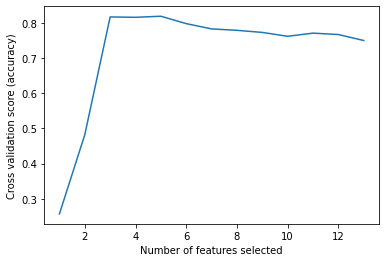

In [20]:
X_train, Y_train = make_classification(
    n_samples=1000,
    n_features=13,
    n_informative=3,
    n_redundant=2,
    n_repeated=0,
    n_classes=8,
    n_clusters_per_class=1,
    random_state=0,
)

# Create the RFE object and compute a cross-validated score.
svc = SVC(kernel="linear")
# The "accuracy" scoring shows the proportion of correct classifications

min_features_to_select = 1  # Minimum number of features to consider
rfecv = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(2),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv.fit(X_train, Y_train)

print("Optimal number of features : %d" % rfecv.n_features_)

# Plot number of features VS. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (accuracy)")
plt.plot(
    range(min_features_to_select, len(rfecv.grid_scores_) + min_features_to_select),
    rfecv.grid_scores_,
)
plt.show()

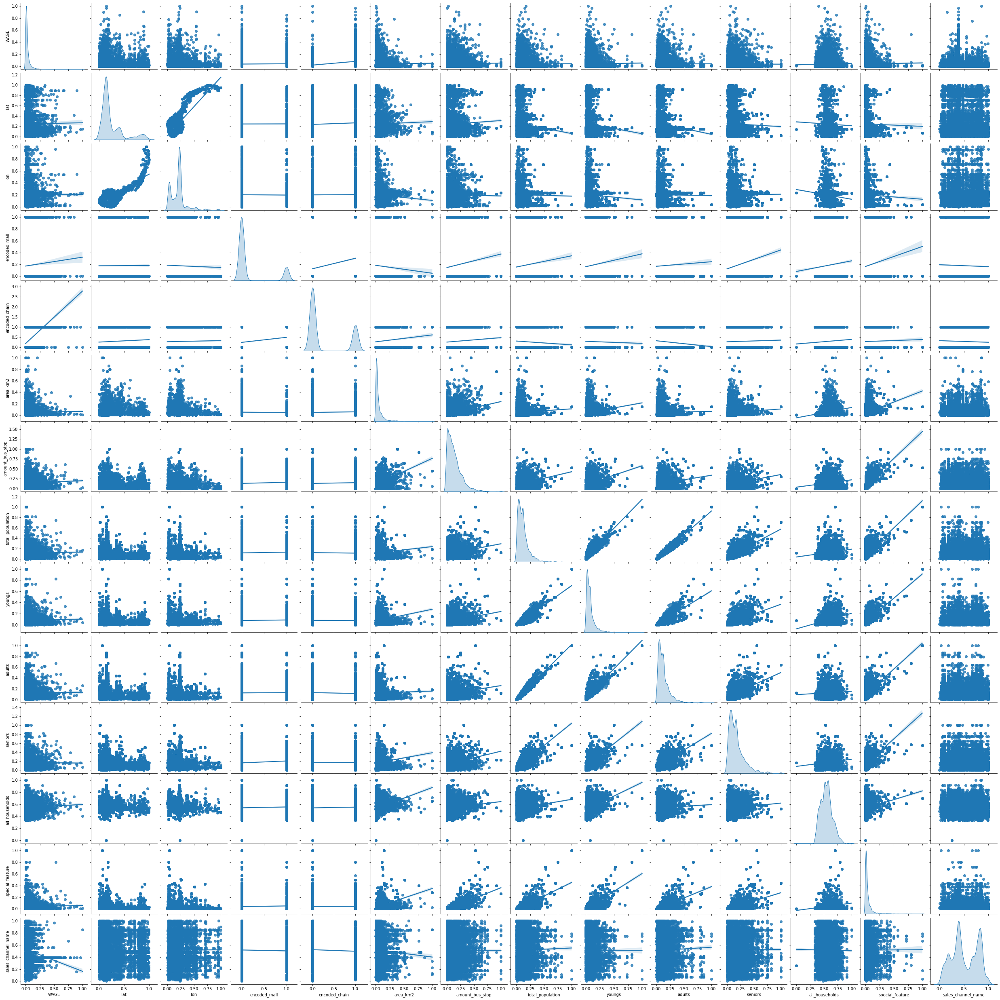

In [35]:
train_dataset = X_train.copy()
train_dataset.insert(0, "WAGE", Y_train)
_ = sns.pairplot(train_dataset, kind="reg", diag_kind="kde")

In [9]:
"""
#train
# Selecting features from initial dataframe
X_train = df_train.loc[:, ['grunnkrets_id']]

# Adding feature chain/mall name encoded
X_train['encoded_mall'] = np.where(df_train['mall_name'].isna(), 0, 1)
X_train['encoded_chain'] = np.where(df_train['chain_name'].isna(), 0, 1)
#test
X_test = df_test.loc[:, ['grunnkrets_id']]
X_test['encoded_mall'] = np.where(df_test['mall_name'].isna(), 0, 1)
X_test['encoded_chain'] = np.where(df_test['chain_name'].isna(), 0, 1)

# Removing the ID of the grunnkret, now it's not useful
X_train = X_train.drop(['grunnkrets_id'], axis=1)
X_test = X_test.drop(['grunnkrets_id'], axis=1)
""""

In [26]:
X_train

array([[1.33446402e-01, 2.10585018e-01, 1.00000000e+00, ...,
        2.11864407e-02, 4.62582666e-01, 1.91696354e-04],
       [1.46469707e-01, 2.30556406e-01, 0.00000000e+00, ...,
        1.67618660e-01, 4.34853231e-01, 6.16059885e-02],
       [1.65623716e-01, 2.12462040e-01, 1.00000000e+00, ...,
        7.62711864e-02, 4.03643114e-01, 6.30136302e-03],
       ...,
       [1.48973018e-01, 2.40884726e-01, 1.00000000e+00, ...,
        2.94491525e-01, 5.10732103e-01, 1.85783084e-02],
       [6.53104645e-02, 4.18896671e-02, 1.00000000e+00, ...,
        8.05084746e-02, 4.43670960e-01, 7.61701964e-05],
       [8.91034644e-01, 5.44171872e-01, 0.00000000e+00, ...,
        2.51059322e-01, 5.65146769e-01, 2.89243143e-02]])

In [15]:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, Ytrain, Ytest = train_test_split(X_train, Y_train)

## First Model: Linear Regression


In [55]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

# print('y-intercept             :' , model.intercept_)
# print('beta coefficients       :' , model.coef_, '\n')

## Second Model : Regression Forest

In [52]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(
#     n_estimators=50,
#     criterion='absolute_error',
    
#     max_depth=None,
    
#     min_samples_split=2,
#     min_samples_leaf=2,
    
#     min_weight_fraction_leaf=0.0,
#     max_features='auto',
#     max_leaf_nodes=None,
#     min_impurity_decrease=0.0,
#     bootstrap=True,
#     oob_score=False,
#     n_jobs=None,
#     random_state=42,
#     verbose=0,
#     warm_start=False,
#     ccp_alpha=0.0,
#     max_samples=None
)

## Running Model

In [53]:
model.fit(Xtrain, Ytrain)
Y_Pred = model.predict(Xtest)

/var/folders/kp/gf91r1cd44g_5v1_qv3n508w0000gn/T/ipykernel_4387/3277403905.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(Xtrain, Ytrain)


## Submission

In [48]:
# Generate submission dataframe 
# NOTE: It is important that the ID and predicted values match
submission = pd.DataFrame()
submission['id'] = df_test.store_id 
submission['predicted'] = np.asarray(scaler.inverse_transform([[elmt] for elmt in Y_Pred]))

# Save it to disk (`index=False` means don't save the index in the csv)
submission.to_csv('sample_submission.csv', index=False)
submission

,id,predicted
0,914206820-914239427-717245,4.436308
1,916789157-916823770-824309,29.578834
2,913341082-977479363-2948,9.111992
3,889682582-889697172-28720,26.020255
4,997991699-998006945-417222,33.032953
...,...,...
8572,917323003-917383529-844309,38.793630
8573,917353379-917411824-845904,7.526646
8574,917072302-917089248-833647,21.996583
8575,916960557-916993161-829908,2.686705


## Analysis prediction (on the training part)

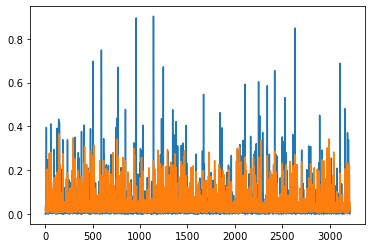

In [54]:
Y_Pred_train = model.predict(Xtest)
plt.plot(range(len(Y_Pred_train)), Ytest)
plt.plot(range(len(Y_Pred_train)), Y_Pred_train)

In [16]:
print("Minimum revenue is :", np.amin(Y_Pred))
print("The number of negative revenue is", np.sum(np.array(Y_Pred) < 0, axis=0), '\n')

Minimum revenue is : 0.018651022877913218
The number of negative revenue is 0 



In [42]:
Y_Pred_train.shape

(3215,)

In [52]:
def rmsle(y_true, y_pred):
    """
    Computes the Root Mean Squared Logarithmic Error 
    
    Args:
        y_true (np.array): n-dimensional vector of ground-truth values 
        y_pred (np.array): n-dimensional vecotr of predicted values 
    
    Returns:
        A scalar float with the rmsle value 
    
    Note: You can alternatively use sklearn and just do: 
        `sklearn.metrics.mean_squared_log_error(y_true, y_pred) ** 0.5`
    """
    assert (y_true >= 0).all(), 'Received negative y_true values'
    assert (y_pred >= 0).all(), 'Received negative y_pred values'
    assert y_true.shape == y_pred.shape, 'y_true and y_pred have different shapes'
    y_true_log1p = np.log1p(y_true)  # log(1 + y_true)
    y_pred_log1p = np.log1p(y_pred)  # log(1 + y_pred)
    return np.sqrt(np.mean(np.square(y_pred_log1p - y_true_log1p)))



print(f'RMSLE prediction: {rmsle(np.asarray([i[0] for i in Ytest]), Y_Pred_train):.4f}')

RMSLE prediction: 0.0539


# New Model

In [34]:
 from sklearn import svm

In [ ]:
model_SVR = svm.SVR(kernel = "poly", degree = 7)
model_SVR.fit(Xtrain, Ytrain)
Y_Pred_train = model_SVR.predict(Xtest)

/Volumes/DILE/applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [ ]:
Y_Pred_train[Y_Pred_train<0]=0

In [ ]:
plt.plot(range(len(Y_Pred_train)), Ytest)
plt.plot(range(len(Y_Pred_train)), Y_Pred_train)

In [60]:
print("Minimum revenue is :", np.amin(Y_Pred))
print("The number of negative revenue is", np.sum(np.array(Y_Pred) < 0, axis=0), '\n')

Minimum revenue is : -0.0104622393045576
The number of negative revenue is [136] 



In [61]:
print("Minimum revenue is :", np.amin(Y_Pred))



Minimum revenue is : -0.0104622393045576


In [65]:
pd.DataFrame(Xtrain).describe()

,0,1,2,3,4,5,6,7,8,9,10,11
count,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000,9644.000000
mean,0.246739,0.202488,0.180734,0.290647,0.049600,0.133711,0.117717,0.076267,0.124857,0.167320,0.542517,0.039291
std,0.227237,0.144728,0.384818,0.454084,0.074938,0.131355,0.101722,0.080379,0.106751,0.139283,0.104820,0.066979
min,0.002059,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.338786,0.000000
25%,0.108670,0.096984,0.000000,0.000000,0.009781,0.027778,0.046229,0.023904,0.052984,0.066737,0.462583,0.005376
50%,0.148397,0.218147,0.000000,0.000000,0.023101,0.111111,0.097689,0.054639,0.098996,0.137712,0.537881,0.017604
75%,0.321295,0.234628,0.000000,1.000000,0.055931,0.194444,0.152354,0.090495,0.159509,0.222458,0.605030,0.043796
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Bayesan


In [55]:
from sklearn import linear_model
reg = linear_model.BayesianRidge()
reg.fit(Xtrain, Ytrain)
Y_Pred_train = reg.predict(Xtest)

/Volumes/DILE/applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [56]:
reg.coef_

array([-0.00753347,  0.00593005,  0.06154988, -0.01172933, -0.02045397])

In [57]:
print(f'RMSLE prediction: {rmsle(np.asarray([i[0] for i in Ytest]), Y_Pred_train):.4f}')

RMSLE prediction: 0.0539


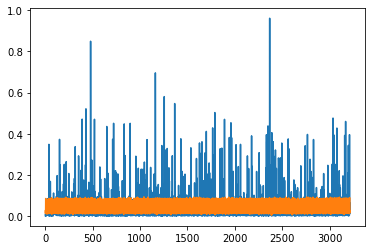

In [59]:
Y_Pred_train = reg.predict(Xtest)
plt.plot(range(len(Y_Pred_train)), Ytest)
plt.plot(range(len(Y_Pred_train)), Y_Pred_train)

In [11]:
from sklearn.linear_model import TweedieRegressor
reg = TweedieRegressor(power=1, alpha=0.2, link='log')
reg.fit(Xtrain, Ytrain)
Y_Pred_train = reg.predict(Xtest)
plt.plot(range(len(Y_Pred_train)), Ytest)
plt.plot(range(len(Y_Pred_train)), Y_Pred_train)

NameError: name 'Xtrain' is not defined

In [64]:
print(f'RMSLE prediction: {rmsle(np.asarray([i[0] for i in Ytest]), Y_Pred_train):.4f}')

RMSLE prediction: 0.0602


In [77]:
from sklearn.neighbors import NearestCentroid
clf = NearestCentroid()
clf.fit(Xtrain, Ytrain)
Y_Pred_train = clf.predict(Xtest)
plt.plot(range(len(Y_Pred_train)), Ytest)
plt.plot(range(len(Y_Pred_train)), Y_Pred_train)

/Volumes/DILE/applications/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


ValueError: Unknown label type: 'continuous'

### XGBoost

In [17]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
Ytrain = le.fit_transform(Ytrain)

In [ ]:
import xgboost as xgb
from xgboost import XGBClassifier
import time
start_time = time.time()
xgb = XGBClassifier(n_estimators = 400, learning_rate = 0.1, max_depth = 3)
xgb.fit(Xtrain, Ytrain)
print('Fit time : ', time.time() - start_time)